# Compare the v3.2 recalibrated SDSS Stripe82 catalog 
# and the DES catalog

### use the SDSS g-i color and linear interpolation for bandpass transformations 

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit

<a id='dataTools'></a>

### Helper Tools

In [3]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [10]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra']-matches['raDES'])*3600
    matches['ddec'] = (matches['dec']-matches['decDES'])*3600
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dg'] = matches['g_mMed'] - matches['gDES'] 
    matches['dr'] = matches['r_mMed'] - matches['rDES'] 
    matches['di'] = matches['i_mMed'] - matches['iDES'] 
    matches['dz'] = matches['z_mMed'] - matches['zDES'] 
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    matches['dgr'] = matches['dg'] - matches['dr'] 
    matches['dri'] = matches['dr'] - matches['di'] 
    matches['diz'] = matches['di'] - matches['dz'] 
    matches['drz'] = matches['dr'] - matches['dz'] 
    matches['dgi'] = matches['dg'] - matches['di'] 
    return

In [30]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-45, "Xmax":47, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-43, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # r SDSS
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    kwOC = {"Xstr":'r_mMed', "Xmin":14.3, "Xmax":22.2, "Xlabel":'SDSS r (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')
   

<a id='dataReading'></a>

### Define paths and catalogs 

In [8]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/Data"
# Doug's match of v3.2 and DES catalog  
DEScatalog = ZIdataDir + "/" + "match_stripe82calibStars_v3.2_des_dr1_cleaned.csv" 
colnamesSDSSDES = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2', 
                'idDES', 'raDES', 'decDES', 
                'gDES', 'rDES', 'iDES', 'zDES', 'yDES', 
                'gErrDES', 'rErrDES', 'iErrDES', 'zErrDES', 'yErrDES', 
                'gNobsDES', 'rNobsDES', 'iNobsDES', 'zNobsDES', 'yNobsDES', 'sep']

In [9]:
sdssDES = Table.read(DEScatalog, format='csv', names=colnamesSDSSDES) 
print(np.size(sdssDES))

619741


In [16]:
derivedColumns(sdssDES)

In [22]:
sdssDESbright = sdssDES[sdssDES['r_mMed']<20]
print(np.size(sdssDES), np.size(sdssDESbright))

619741 328673


=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -0.0007144803499998121 std.dev.All: 0.019930604771026098
N= 618278 min= -0.2995947187999985 max= 0.2999683655999973
median: -0.0006471565999982302 std.dev: 0.005014807530631091
saved plot as: colorResidDES_dg_RA.png


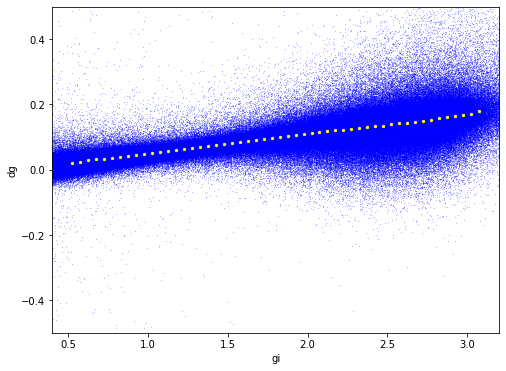

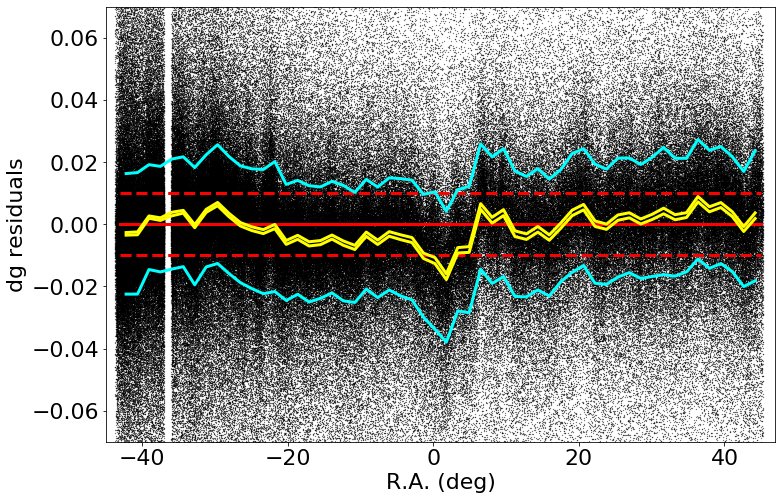

made plot colorResidDES_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0007144803499998121 std.dev.All: 0.019930604771026098
N= 618278 min= -0.2995947187999985 max= 0.2999683655999973
median: -0.0005240800499996395 std.dev: 0.0013230949357776907
saved plot as: colorResidDES_dg_Dec.png


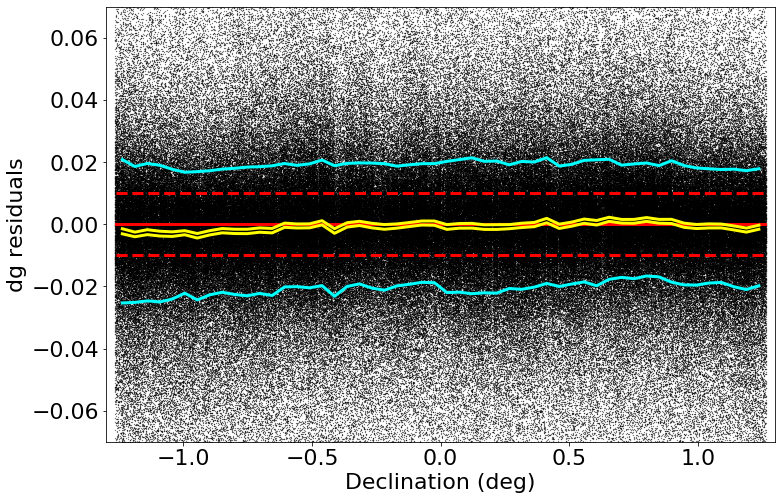

made plot colorResidDES_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0007144803499998121 std.dev.All: 0.019930604771026098
N= 618278 min= -0.2995947187999985 max= 0.2999683655999973
median: 0.0010196727999991148 std.dev: 0.006416637855240426
saved plot as: colorResidDES_dg_rmag.png


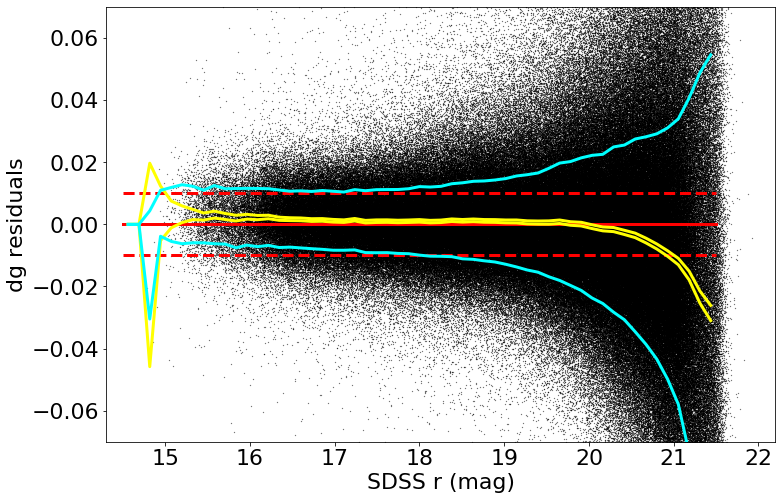

made plot colorResidDES_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -0.00047466809999828843 std.dev.All: 0.014743832999025042
N= 619416 min= -0.2998677199999968 max= 0.2996437300000032
median: -0.0015802673250003355 std.dev: 0.004310743731177069
saved plot as: colorResidDES_dr_RA.png


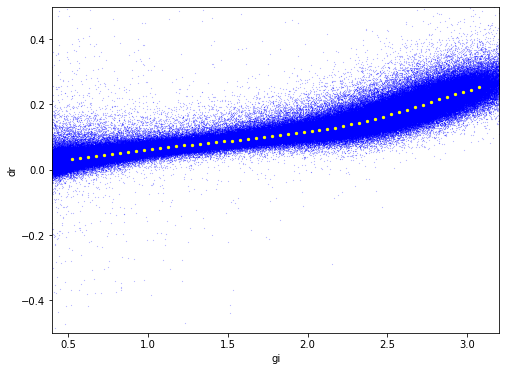

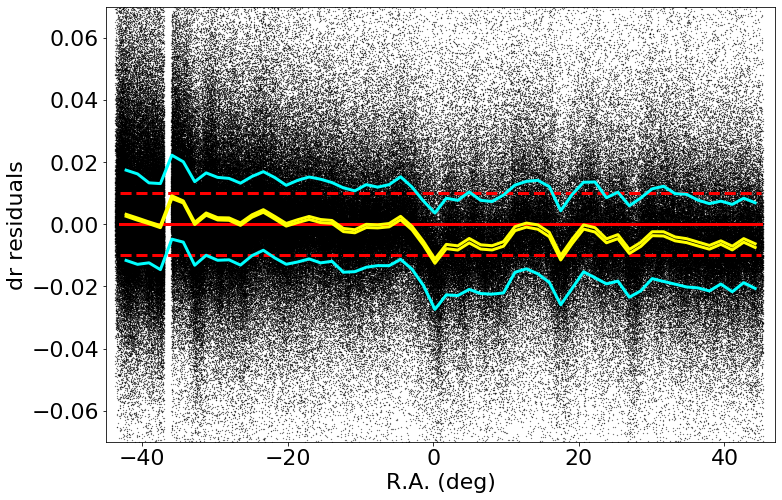

made plot colorResidDES_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00047466809999828843 std.dev.All: 0.014743832999025042
N= 619416 min= -0.2998677199999968 max= 0.2996437300000032
median: -0.0005874568000001877 std.dev: 0.0009787151945891942
saved plot as: colorResidDES_dr_Dec.png


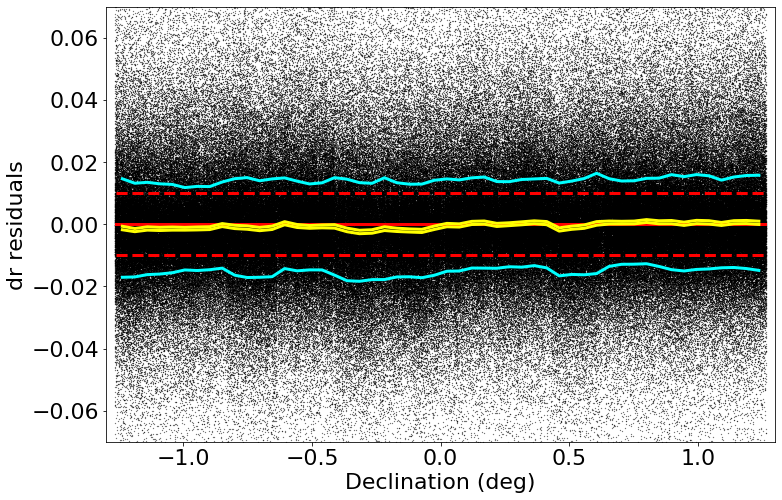

made plot colorResidDES_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00047466809999828843 std.dev.All: 0.014743832999025042
N= 619416 min= -0.2998677199999968 max= 0.2996437300000032
median: -0.0014190720000004237 std.dev: 0.005428183220119592
saved plot as: colorResidDES_dr_rmag.png


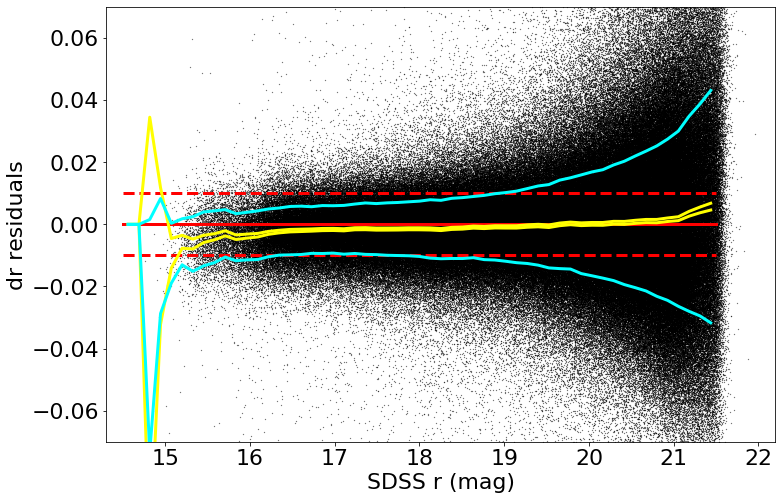

made plot colorResidDES_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -0.00019543350000141707 std.dev.All: 0.015226139617652732
N= 619336 min= -0.29931587320000097 max= 0.2995859300000028
median: -0.002796003200000438 std.dev: 0.00623325419230862
saved plot as: colorResidDES_di_RA.png


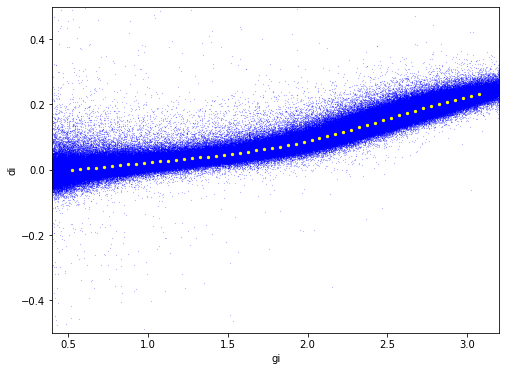

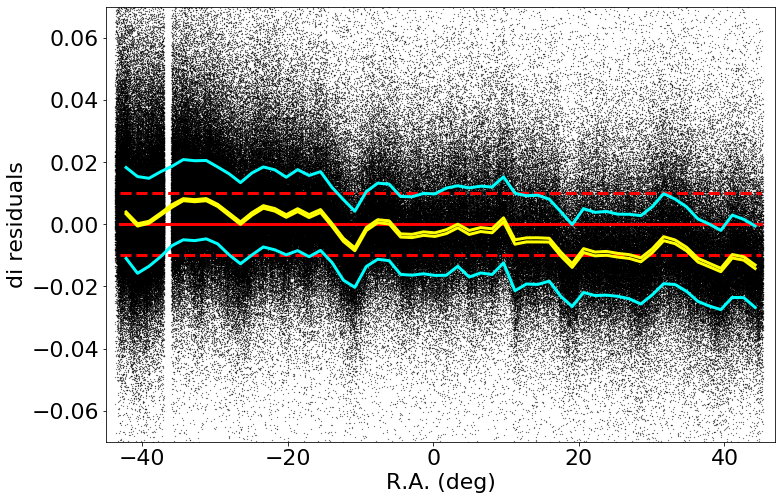

made plot colorResidDES_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00019543350000141707 std.dev.All: 0.015226139617652732
N= 619336 min= -0.29931587320000097 max= 0.2995859300000028
median: -9.492832499948586e-05 std.dev: 0.0014015098593877936
saved plot as: colorResidDES_di_Dec.png


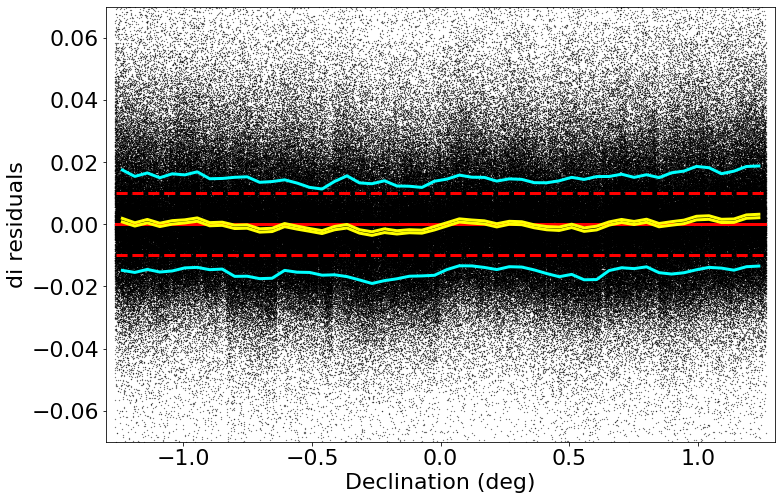

made plot colorResidDES_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00019543350000141707 std.dev.All: 0.015226139617652732
N= 619336 min= -0.29931587320000097 max= 0.2995859300000028
median: -0.0017923999999993612 std.dev: 0.0053400458769690025
saved plot as: colorResidDES_di_rmag.png


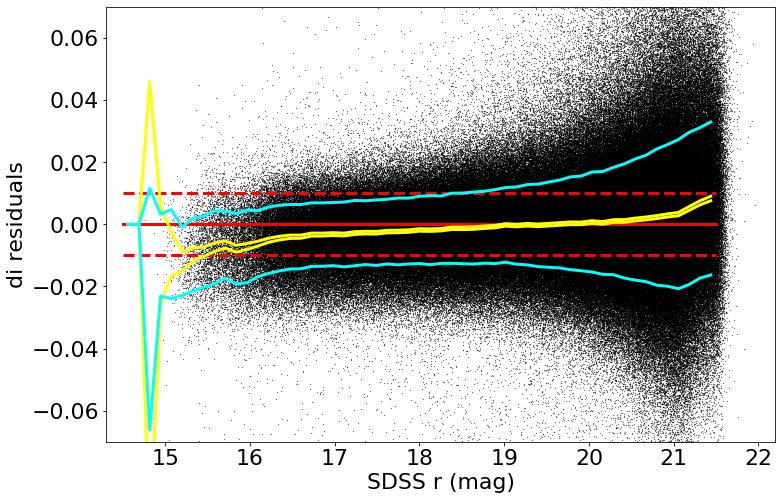

made plot colorResidDES_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -0.0003628151000020527 std.dev.All: 0.024145225112772863
N= 618760 min= -0.29991204629999857 max= 0.2998935628999999
median: -0.0035696235000009895 std.dev: 0.012551822531662683
saved plot as: colorResidDES_dz_RA.png


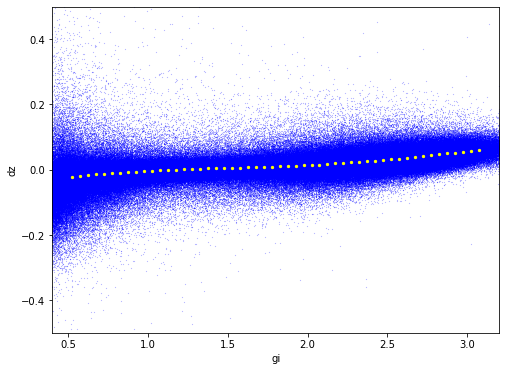

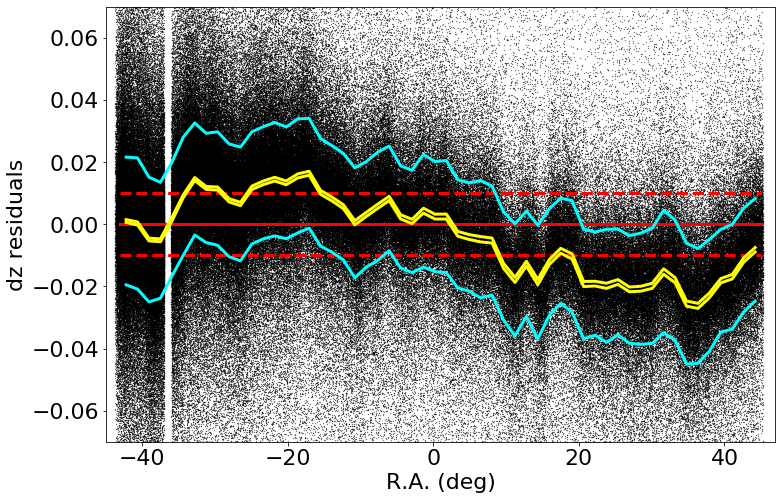

made plot colorResidDES_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0003628151000020527 std.dev.All: 0.024145225112772863
N= 618760 min= -0.29991204629999857 max= 0.2998935628999999
median: 0.0001639704499997261 std.dev: 0.0032316703772391773
saved plot as: colorResidDES_dz_Dec.png


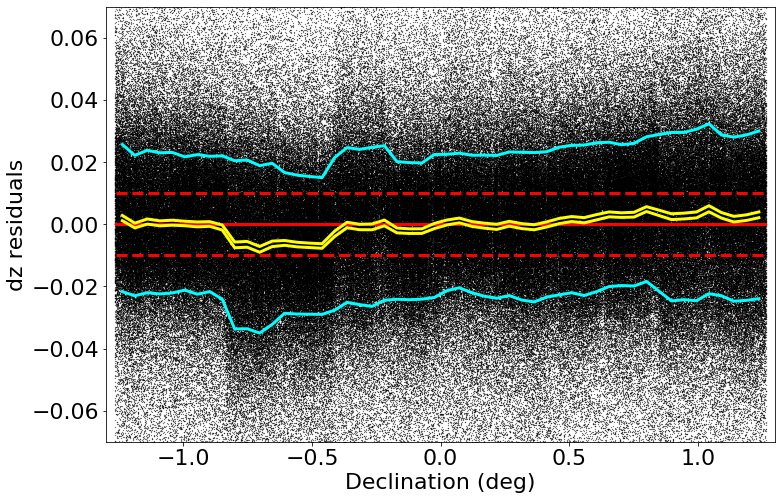

made plot colorResidDES_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0003628151000020527 std.dev.All: 0.024145225112772863
N= 618760 min= -0.29991204629999857 max= 0.2998935628999999
median: 0.0011625518000032819 std.dev: 0.0032794107234385118
saved plot as: colorResidDES_dz_rmag.png


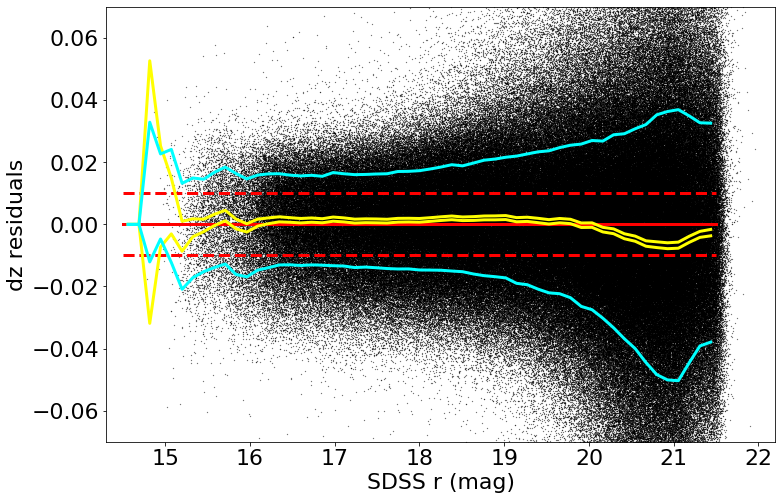

made plot colorResidDES_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: 4.90853999966373e-05 std.dev.All: 0.023367095066248414
N= 618887 min= -0.2996853277999988 max= 0.2987198429000013
median: -0.00016505199999792132 std.dev: 0.006410777768780573
saved plot as: colorResidDES_dgr_RA.png


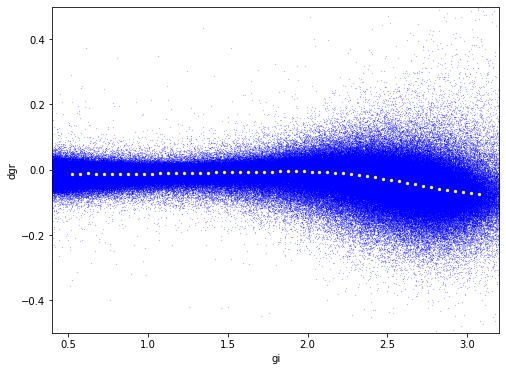

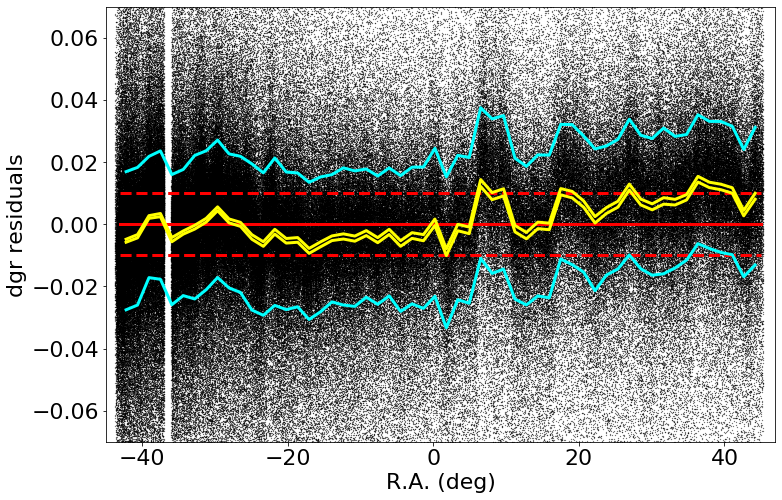

made plot colorResidDES_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: 4.90853999966373e-05 std.dev.All: 0.023367095066248414
N= 618887 min= -0.2996853277999988 max= 0.2987198429000013
median: -0.00024292072499911346 std.dev: 0.0014594116059794323
saved plot as: colorResidDES_dgr_Dec.png


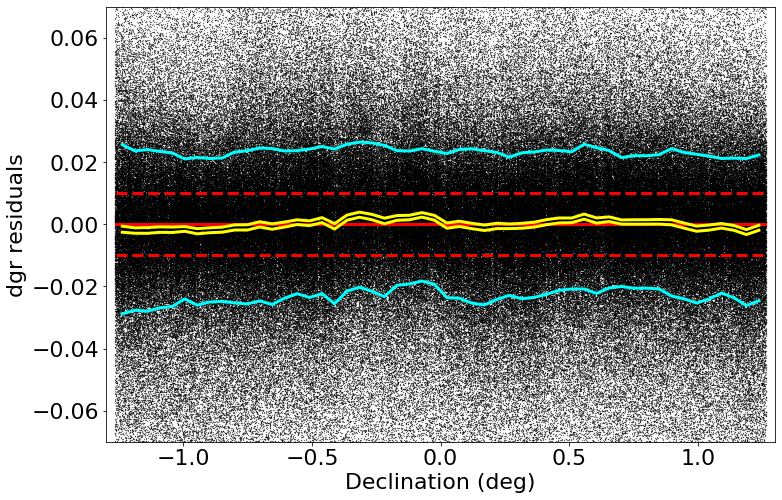

made plot colorResidDES_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 4.90853999966373e-05 std.dev.All: 0.023367095066248414
N= 618887 min= -0.2996853277999988 max= 0.2987198429000013
median: 0.0022804340000000447 std.dev: 0.008563165739092547
saved plot as: colorResidDES_dgr_rmag.png


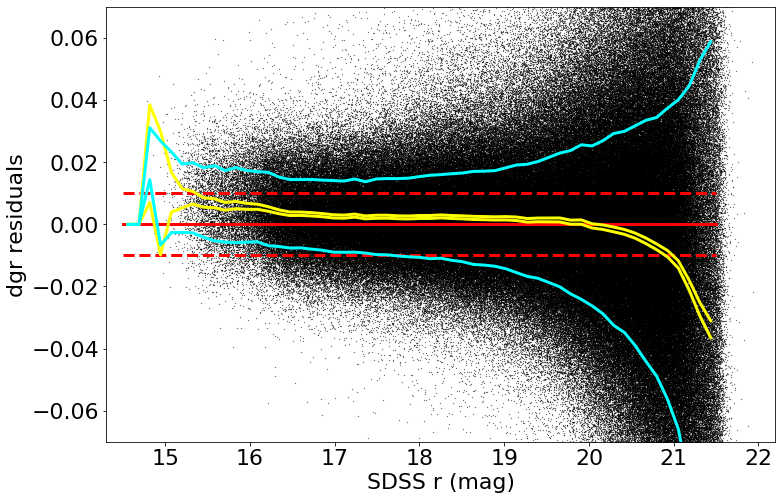

made plot colorResidDES_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -0.00020870909999946147 std.dev.All: 0.016157751678901888
N= 619571 min= -0.29638466000000463 max= 0.28988440800000115
median: 0.0009288284249993565 std.dev: 0.004535317696833835
saved plot as: colorResidDES_dri_RA.png


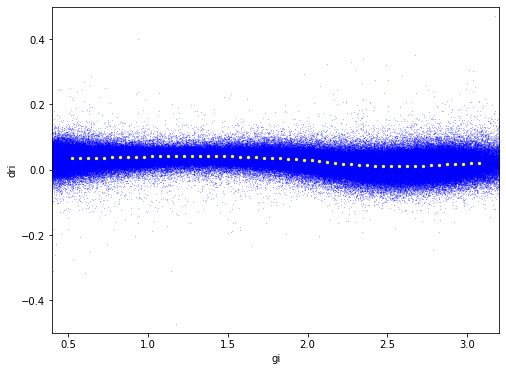

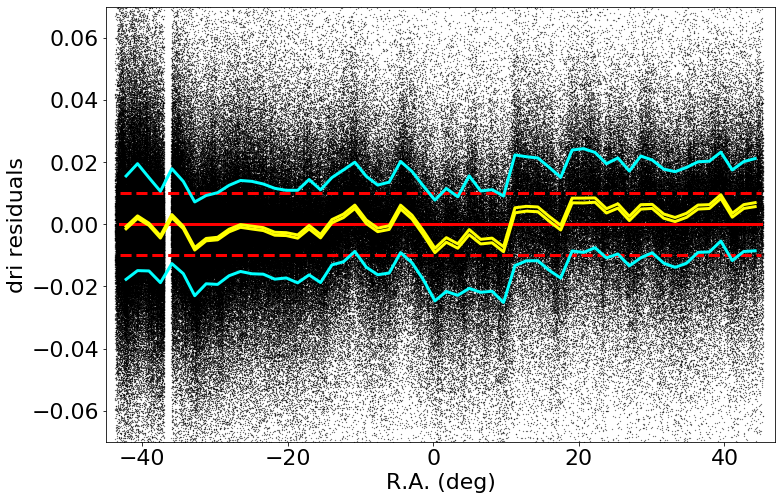

made plot colorResidDES_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00020870909999946147 std.dev.All: 0.016157751678901888
N= 619571 min= -0.29638466000000463 max= 0.28988440800000115
median: -6.256570000175501e-05 std.dev: 0.0010349255441931807
saved plot as: colorResidDES_dri_Dec.png


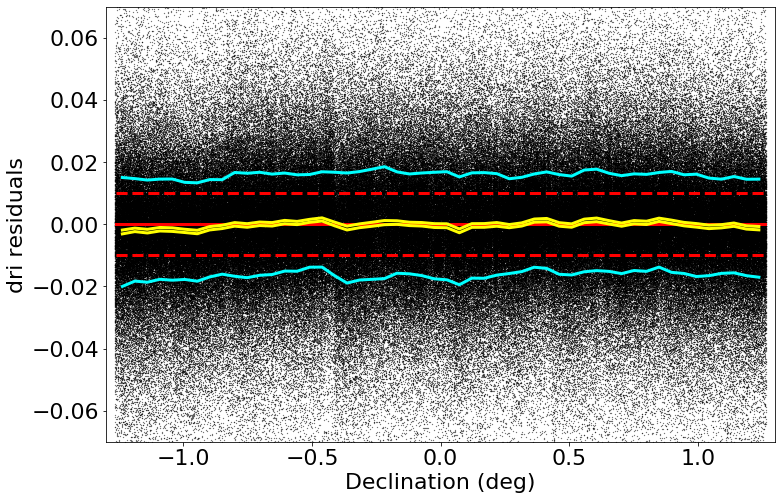

made plot colorResidDES_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00020870909999946147 std.dev.All: 0.016157751678901888
N= 619571 min= -0.29638466000000463 max= 0.28988440800000115
median: -0.00023364670000193544 std.dev: 0.0017290151157215306
saved plot as: colorResidDES_dri_rmag.png


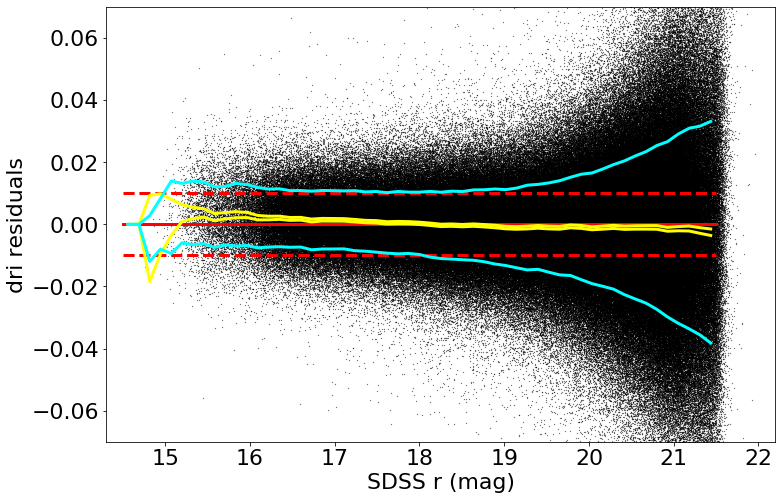

made plot colorResidDES_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: 0.00038854170000120897 std.dev.All: 0.02301177789690256
N= 619150 min= -0.2996804699999984 max= 0.2999230500000003
median: 0.0006973922000006755 std.dev: 0.008473346795125873
saved plot as: colorResidDES_diz_RA.png


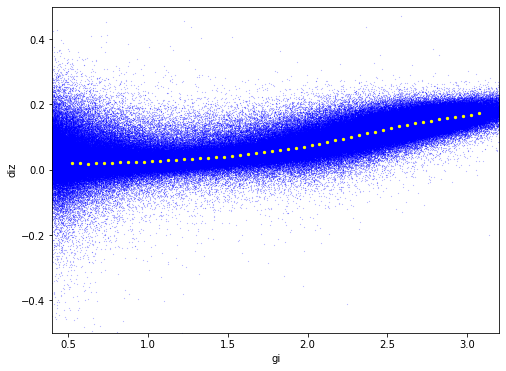

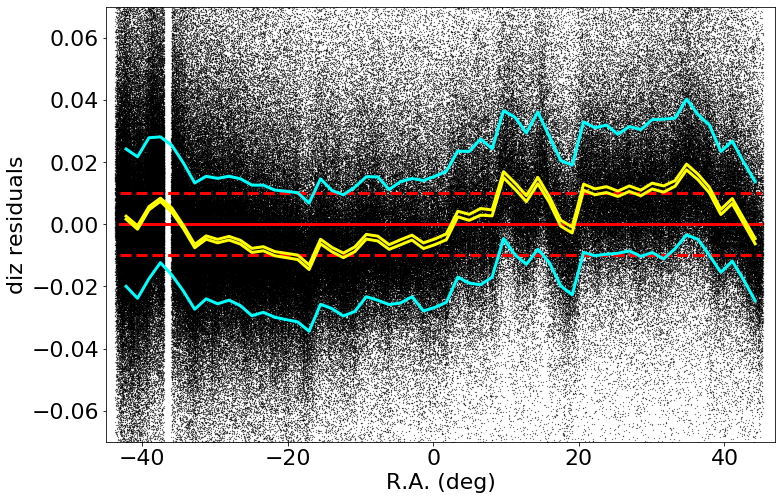

made plot colorResidDES_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.00038854170000120897 std.dev.All: 0.02301177789690256
N= 619150 min= -0.2996804699999984 max= 0.2999230500000003
median: -1.1354700000333617e-05 std.dev: 0.002292548815039501
saved plot as: colorResidDES_diz_Dec.png


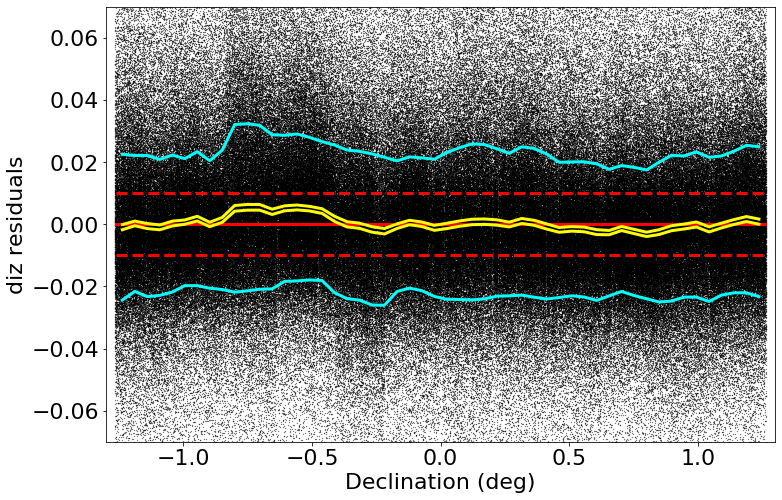

made plot colorResidDES_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.00038854170000120897 std.dev.All: 0.02301177789690256
N= 619150 min= -0.2996804699999984 max= 0.2999230500000003
median: -0.0025844364000052328 std.dev: 0.007615412374950633
saved plot as: colorResidDES_diz_rmag.png


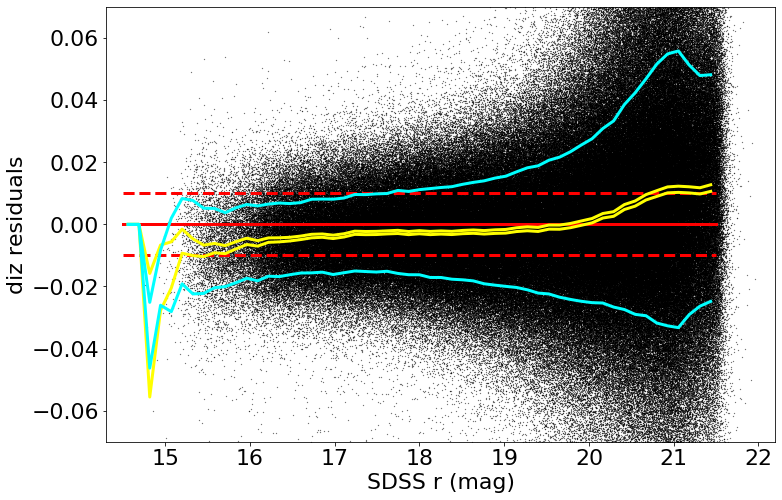

made plot colorResidDES_diz_rmag.png
------------------------------------------------------------------


In [31]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDES, keywords)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -0.0004994284999995935 std.dev.All: 0.01251250095420028
N= 328563 min= -0.2833354899999989 max= 0.2991639512000006
median: -0.00029074905000101015 std.dev: 0.005007750950912429
saved plot as: colorResidDESbright_dg_RA.png


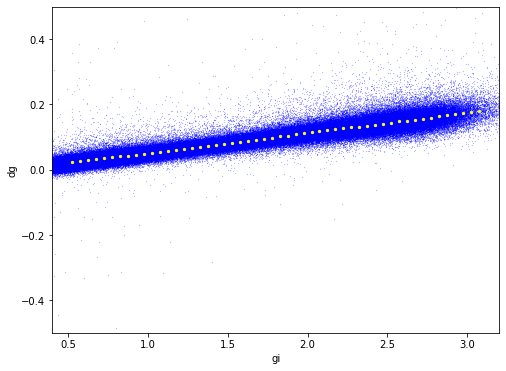

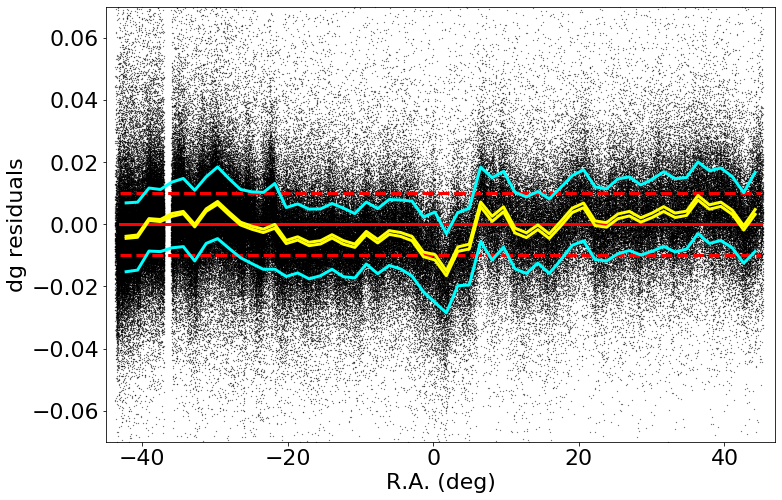

made plot colorResidDESbright_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0004994284999995935 std.dev.All: 0.01251250095420028
N= 328563 min= -0.2833354899999989 max= 0.2991639512000006
median: -0.00031287339999973296 std.dev: 0.001300631519205032
saved plot as: colorResidDESbright_dg_Dec.png


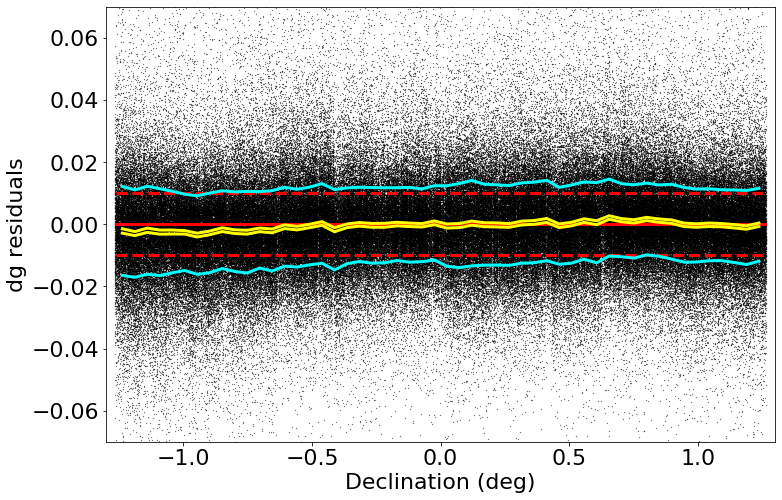

made plot colorResidDESbright_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0004994284999995935 std.dev.All: 0.01251250095420028
N= 328563 min= -0.2833354899999989 max= 0.2991639512000006
median: -0.000402804575000441 std.dev: 0.002551841842371865
saved plot as: colorResidDESbright_dg_rmag.png


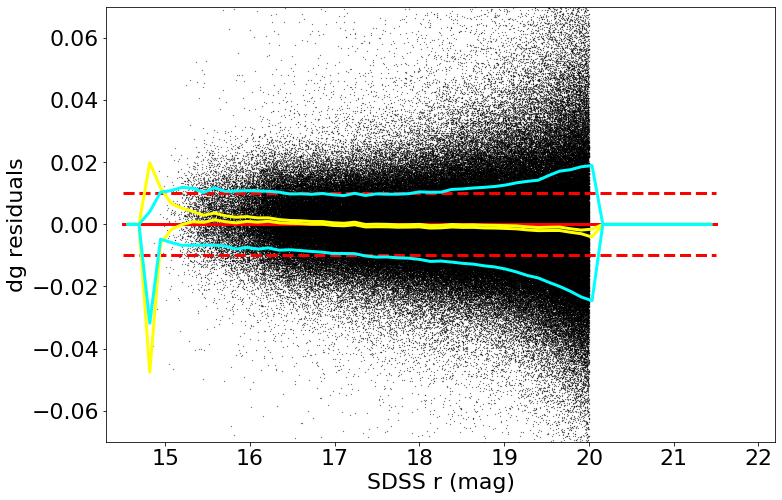

made plot colorResidDESbright_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -0.00046300170000310864 std.dev.All: 0.010218688993498596
N= 328645 min= -0.29786586479999666 max= 0.29513365800000213
median: -0.0015383151999998242 std.dev: 0.00409550207161886
saved plot as: colorResidDESbright_dr_RA.png


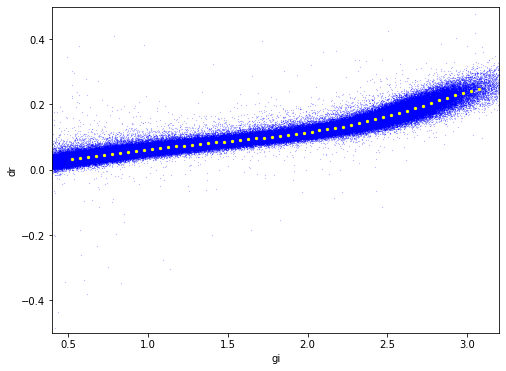

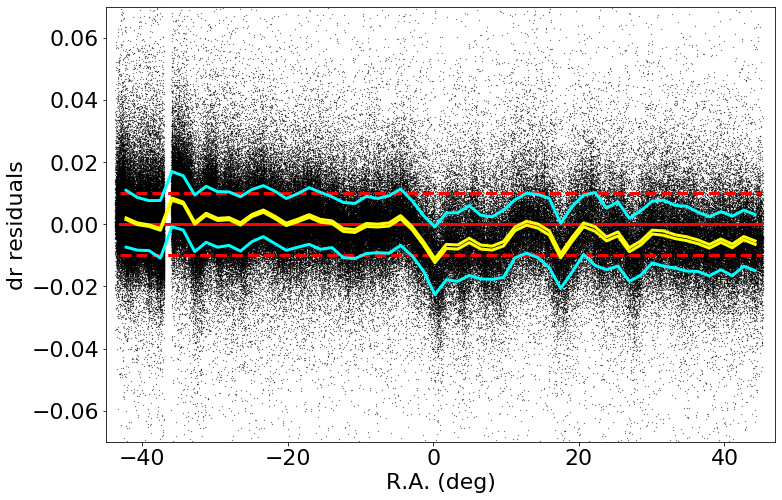

made plot colorResidDESbright_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00046300170000310864 std.dev.All: 0.010218688993498596
N= 328645 min= -0.29786586479999666 max= 0.29513365800000213
median: -0.00048293224999968257 std.dev: 0.0007166377095560258
saved plot as: colorResidDESbright_dr_Dec.png


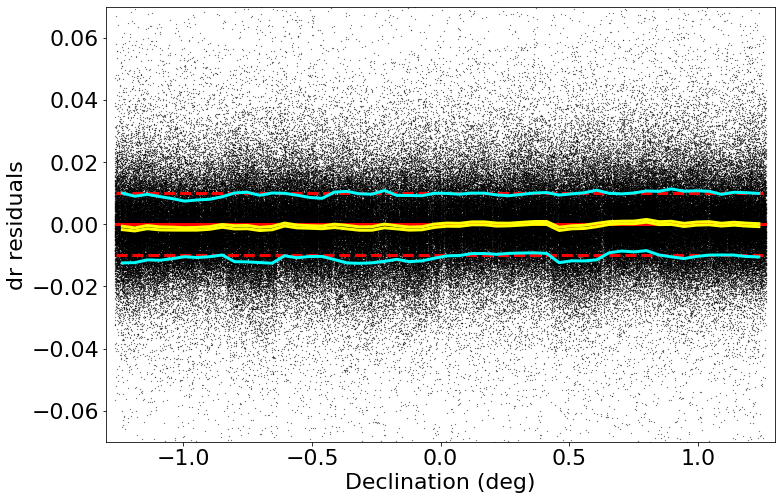

made plot colorResidDESbright_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00046300170000310864 std.dev.All: 0.010218688993498596
N= 328645 min= -0.29786586479999666 max= 0.29513365800000213
median: -0.000840870150000091 std.dev: 0.005745579777991985
saved plot as: colorResidDESbright_dr_rmag.png


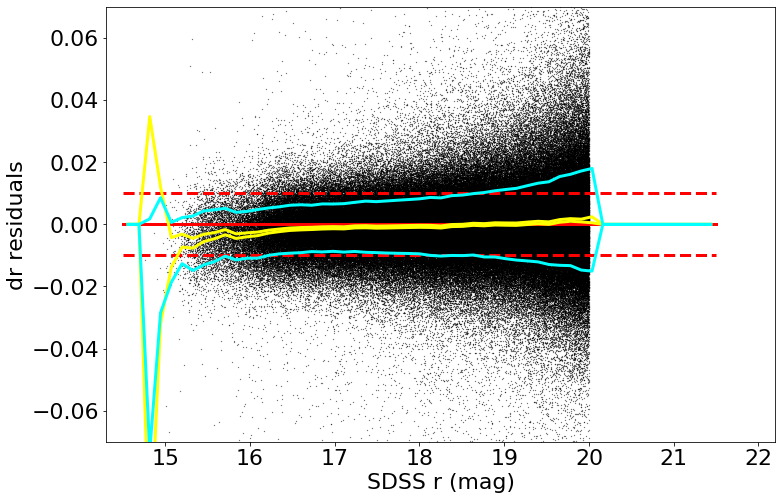

made plot colorResidDESbright_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -0.00031832355000168885 std.dev.All: 0.01179609674490068
N= 328586 min= -0.2961721863999982 max= 0.2837124626999976
median: -0.0033163345750006792 std.dev: 0.00621800752953646
saved plot as: colorResidDESbright_di_RA.png


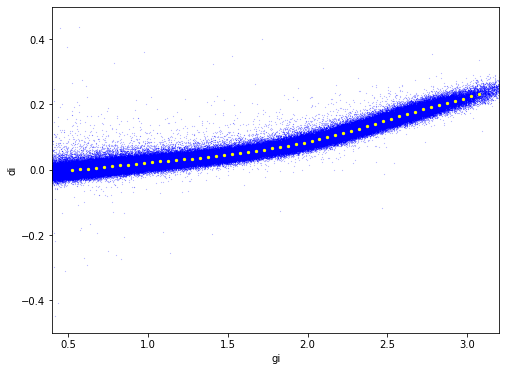

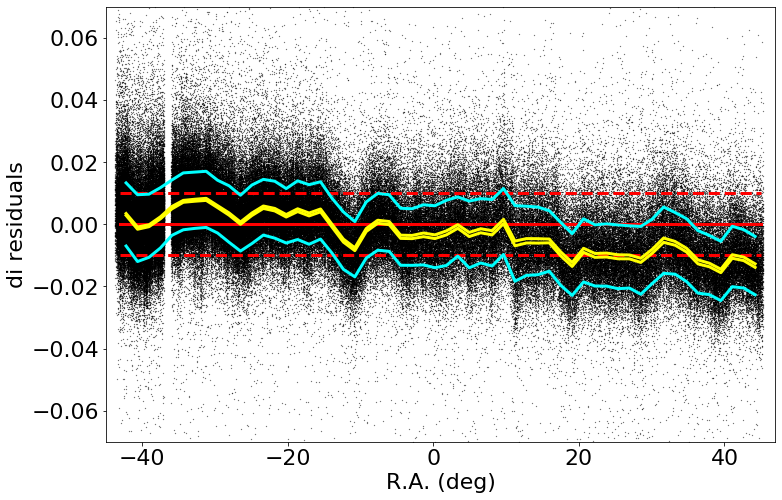

made plot colorResidDESbright_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00031832355000168885 std.dev.All: 0.01179609674490068
N= 328586 min= -0.2961721863999982 max= 0.2837124626999976
median: -0.0003183058749972323 std.dev: 0.0009705398689314588
saved plot as: colorResidDESbright_di_Dec.png


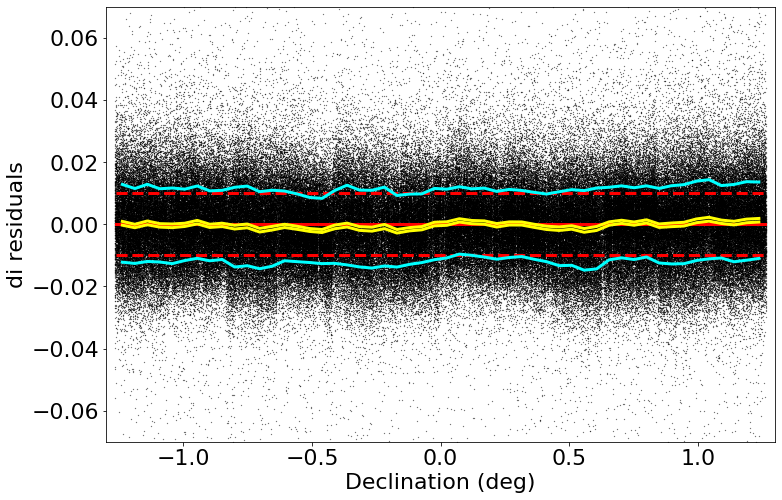

made plot colorResidDESbright_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00031832355000168885 std.dev.All: 0.01179609674490068
N= 328586 min= -0.2961721863999982 max= 0.2837124626999976
median: -0.001610484250001834 std.dev: 0.005270713458564819
saved plot as: colorResidDESbright_di_rmag.png


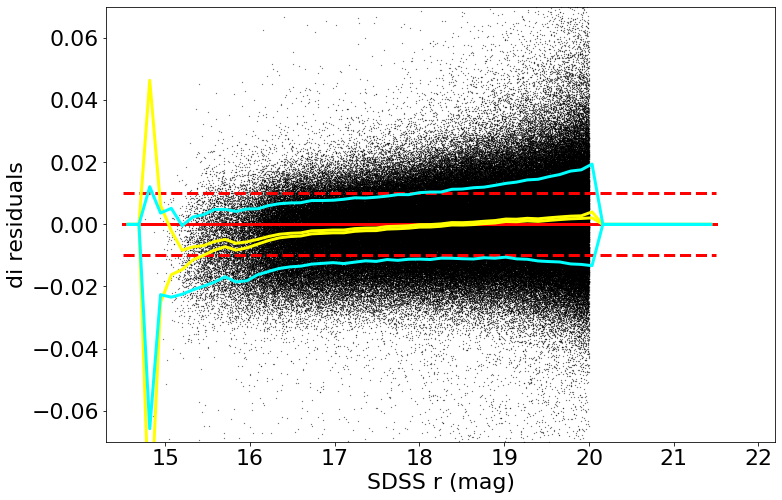

made plot colorResidDESbright_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -0.0002897474499988853 std.dev.All: 0.018102790445025205
N= 328584 min= -0.29233687260000146 max= 0.2999552840000014
median: -0.004348249674999773 std.dev: 0.012094578449195748
saved plot as: colorResidDESbright_dz_RA.png


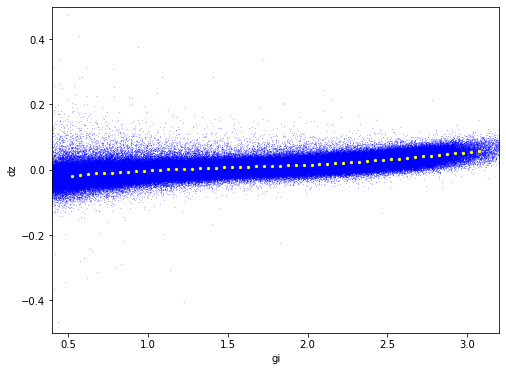

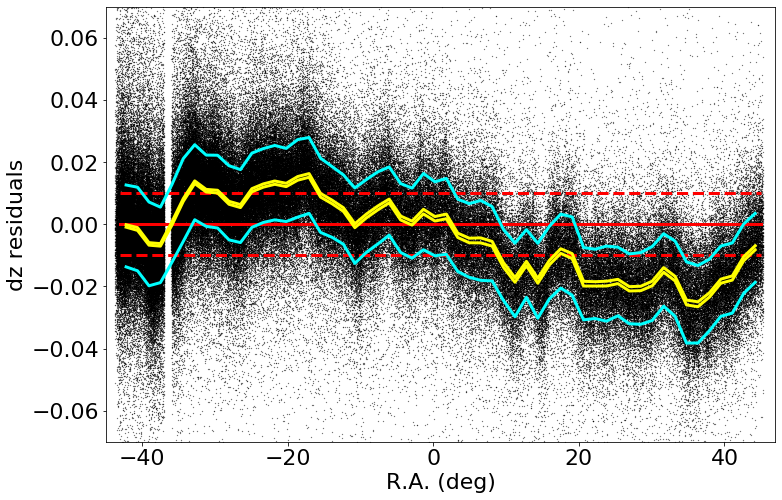

made plot colorResidDESbright_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0002897474499988853 std.dev.All: 0.018102790445025205
N= 328584 min= -0.29233687260000146 max= 0.2999552840000014
median: 0.00025231614999896967 std.dev: 0.001990662175218211
saved plot as: colorResidDESbright_dz_Dec.png


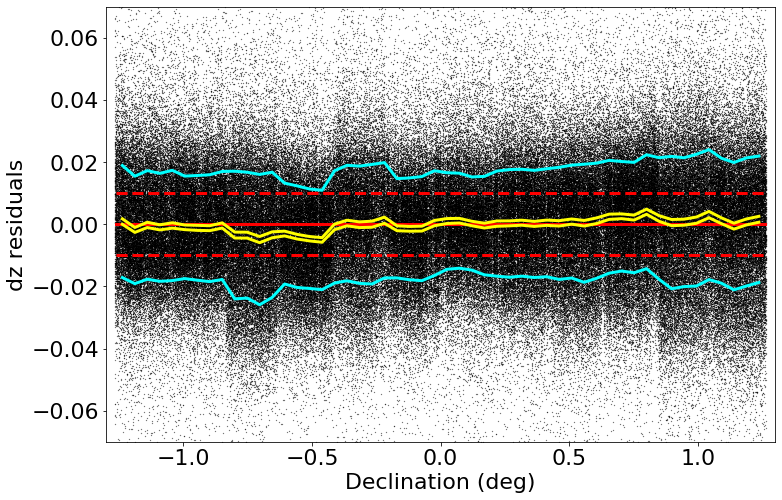

made plot colorResidDESbright_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0002897474499988853 std.dev.All: 0.018102790445025205
N= 328584 min= -0.29233687260000146 max= 0.2999552840000014
median: -0.0004281366750011591 std.dev: 0.002079731421711714
saved plot as: colorResidDESbright_dz_rmag.png


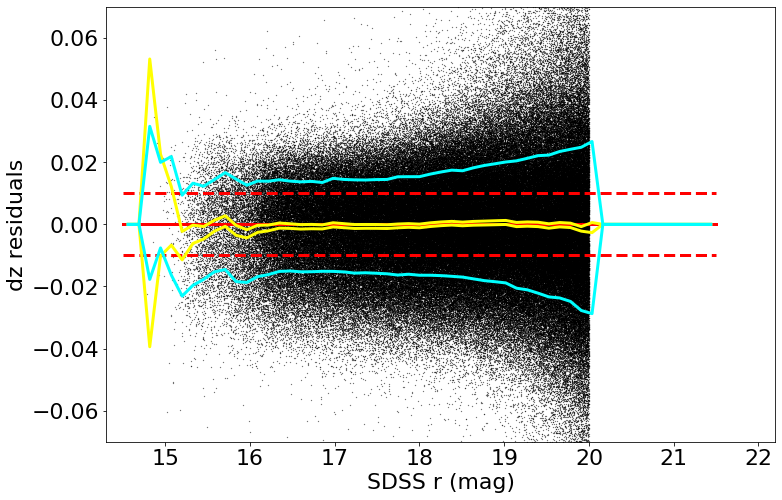

made plot colorResidDESbright_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: 0.00012010559999722954 std.dev.All: 0.014921343161405361
N= 328607 min= -0.2773266198999981 max= 0.29586636999999527
median: 3.124600000101608e-05 std.dev: 0.0063549696054719645
saved plot as: colorResidDESbright_dgr_RA.png


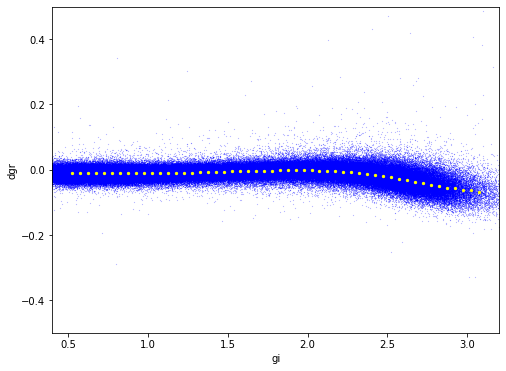

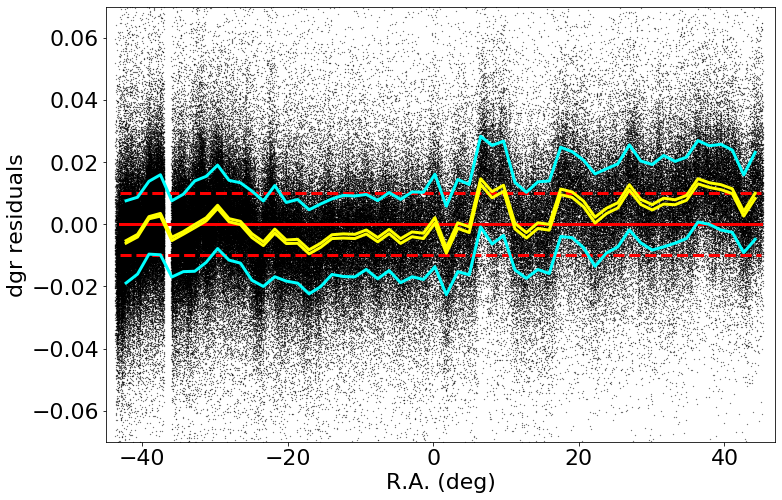

made plot colorResidDESbright_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.00012010559999722954 std.dev.All: 0.014921343161405361
N= 328607 min= -0.2773266198999981 max= 0.29586636999999527
median: 0.00016276297499886788 std.dev: 0.0010943477380320156
saved plot as: colorResidDESbright_dgr_Dec.png


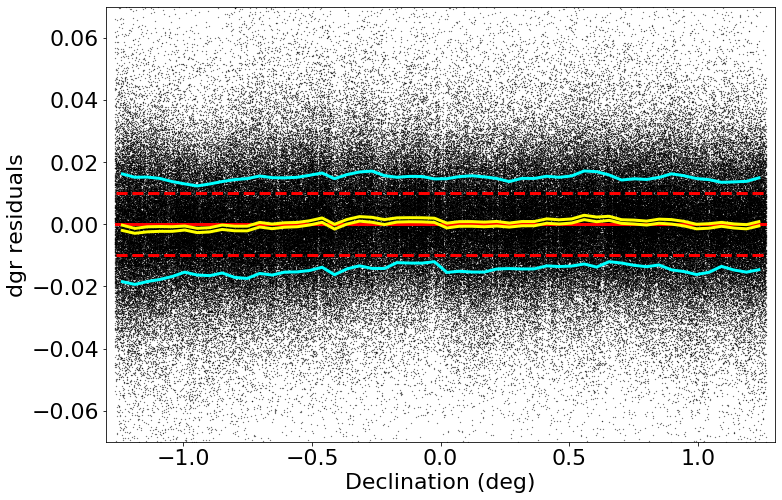

made plot colorResidDESbright_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.00012010559999722954 std.dev.All: 0.014921343161405361
N= 328607 min= -0.2773266198999981 max= 0.29586636999999527
median: 0.0004098347999993892 std.dev: 0.004395078915277413
saved plot as: colorResidDESbright_dgr_rmag.png


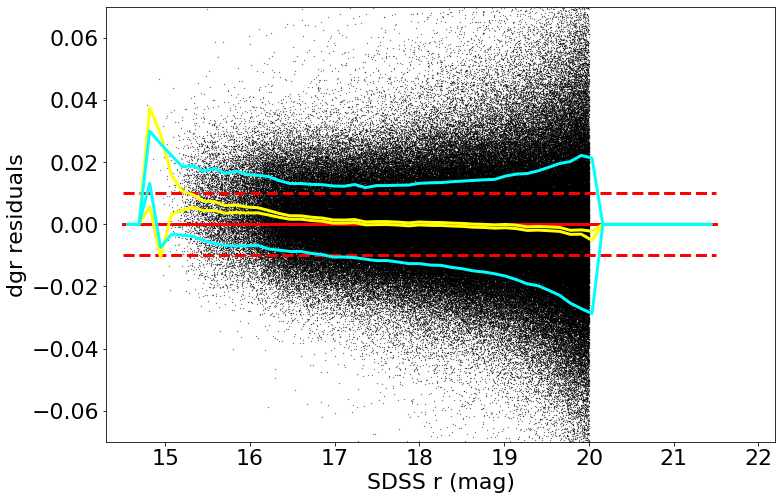

made plot colorResidDESbright_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -0.0001805048000020626 std.dev.All: 0.011603375612403452
N= 328607 min= -0.2737219006000015 max= 0.2882748419999971
median: 0.0010078670999982397 std.dev: 0.004676461422095697
saved plot as: colorResidDESbright_dri_RA.png


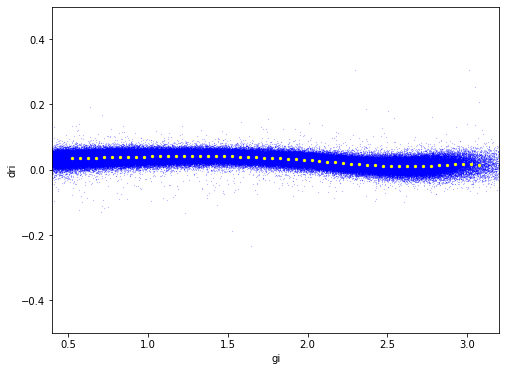

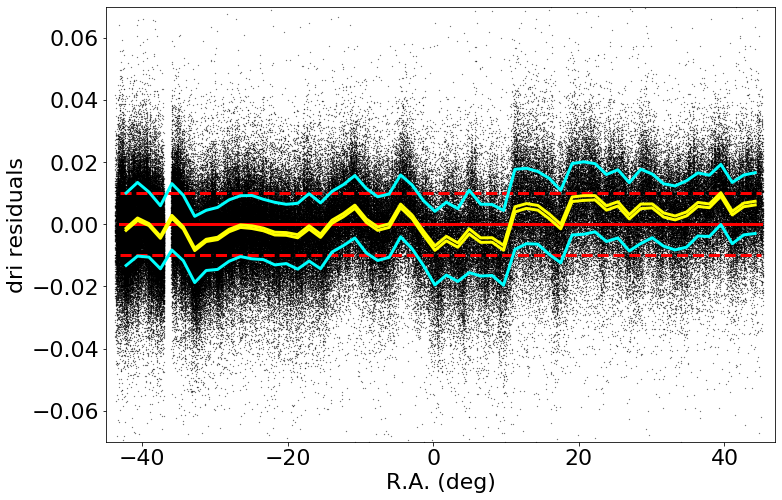

made plot colorResidDESbright_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0001805048000020626 std.dev.All: 0.011603375612403452
N= 328607 min= -0.2737219006000015 max= 0.2882748419999971
median: -0.00016200964999917153 std.dev: 0.0008032457543690866
saved plot as: colorResidDESbright_dri_Dec.png


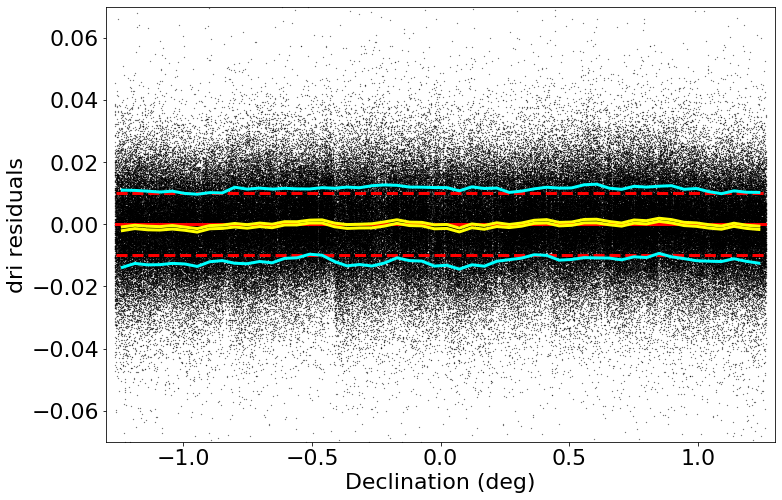

made plot colorResidDESbright_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0001805048000020626 std.dev.All: 0.011603375612403452
N= 328607 min= -0.2737219006000015 max= 0.2882748419999971
median: 0.0002016573999999438 std.dev: 0.0017442194292078322
saved plot as: colorResidDESbright_dri_rmag.png


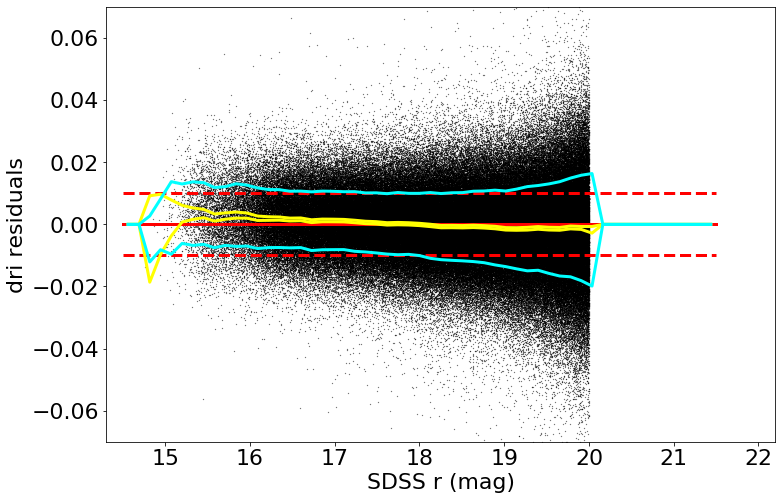

made plot colorResidDESbright_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -6.498000000308701e-05 std.dev.All: 0.015906596694297722
N= 328595 min= -0.28021268059999743 max= 0.25612452000000374
median: 9.872287499951109e-05 std.dev: 0.007876046100778833
saved plot as: colorResidDESbright_diz_RA.png


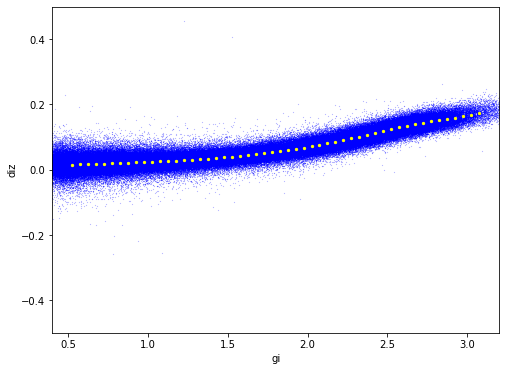

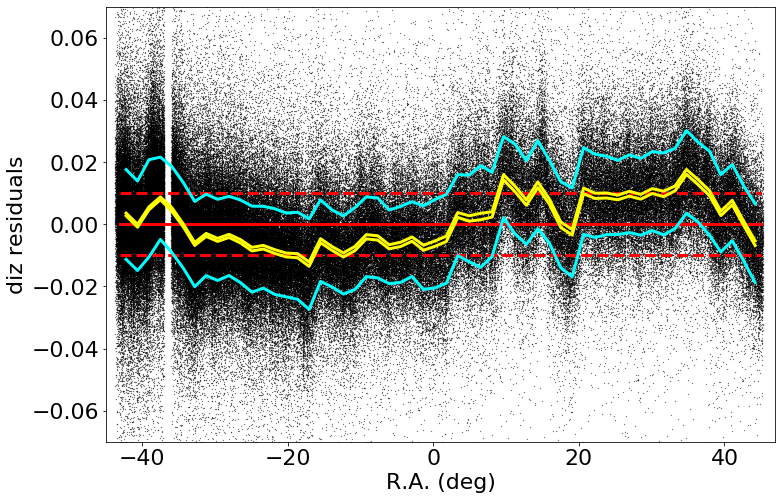

made plot colorResidDESbright_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -6.498000000308701e-05 std.dev.All: 0.015906596694297722
N= 328595 min= -0.28021268059999743 max= 0.25612452000000374
median: -0.0002816062500001909 std.dev: 0.001369317739492327
saved plot as: colorResidDESbright_diz_Dec.png


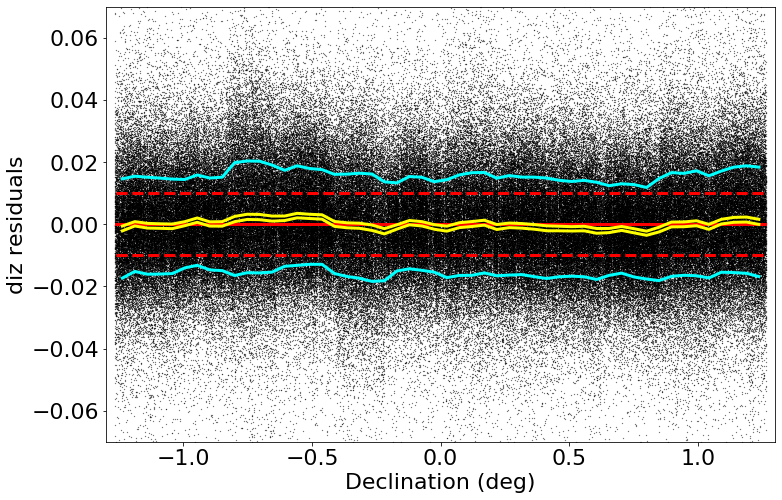

made plot colorResidDESbright_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -6.498000000308701e-05 std.dev.All: 0.015906596694297722
N= 328595 min= -0.28021268059999743 max= 0.25612452000000374
median: -0.00038272099999945436 std.dev: 0.005876146810452277
saved plot as: colorResidDESbright_diz_rmag.png


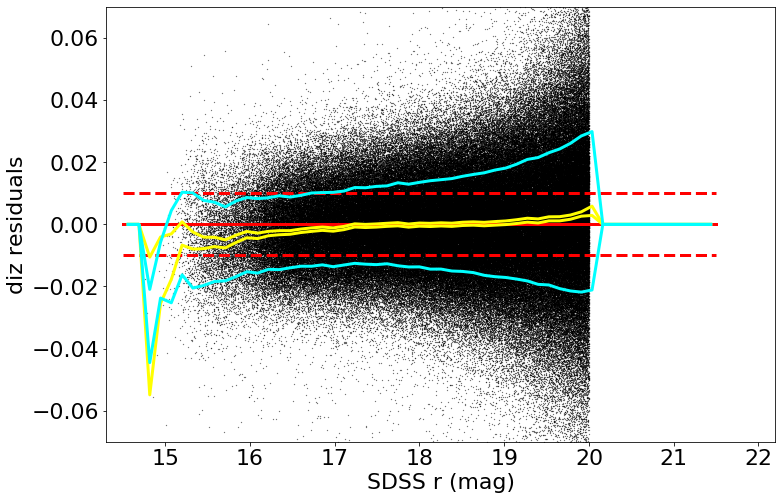

made plot colorResidDESbright_diz_rmag.png
------------------------------------------------------------------


In [32]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDESbright_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDESbright, keywords)